In [1]:
import pandas as pd
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.visualization import make_lupton_rgb
plt.style.use('dark_background')

In [18]:
data_zoo = pd.read_csv('data/complete_data.csv')

from mpl_toolkits.mplot3d import Axes3D
#%matplotlib inline
%matplotlib widget

# Calculate the size for the points
size = (data_zoo['average'] + [0.7]*len(data_zoo))**5.5

# Create a figure
fig = plt.figure(figsize=(10, 7))

# Add a 3D subplot
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(data_zoo['SINGLE'], data_zoo['K_SCORE'], data_zoo['score_sims'], 
                s=size.values, edgecolors='#00008B', facecolors='none', linewidth=1.)

# Set labels
ax.set_xlabel('Jimena')
ax.set_ylabel('Karina')
ax.set_zlabel('Jacobs')
ax.set_title('3D Scatter plot of beta test')

# Show plot
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [3]:
filepath = '/Users/jimenagonzalez/research/DSPL/Citizen_science_project/Intersection/data/in_sled2.fits'
hdu_list = fits.open(filepath)
images = hdu_list[1].data
data = pd.DataFrame(hdu_list[2].data)
hdu_list.close()

data.replace('None', np.nan, inplace=True)
data = data.astype({'COADD_OBJECT_ID': int, 'K_RA': float, 'K_DEC': float, 'K_SCORE': float, 'Y3_COADD_OBJECT_ID': int,
       'J_RA': float, 'J_DEC': float, 'score_sims': float, 'score_real': float, 'score_both': float, 'G_RA': float,
       'G_DEC': float, 'SINGLE': float, 'RING': float, 'SMOOTH': float, 'COMPANIONS': float, 'SDSS_SPIRALS': float,
       'DES_SPIRALS': float, 'CROWDED': float, 'ARTIFACTS': float, 'MOST_NEGATIVES': float, 'index': int, 'ra': float,
       'dec': float, 'name': str, 'score': float, 'image_sep': float, 'info': str, 'n_img': float, 'flag': str,
       'image_conf': str, 'lens_type': str, 'source_type': str, 'contaminant_type': str, 'papers': str})

#Getting the images
data.set_index('COADD_OBJECT_ID', inplace=True)
data_zoo.set_index('COADD_OBJECT_ID', inplace=True)
# Reindex 'data' to match the index of 'data_zoo'
data = data.reindex(data_zoo.index)
# Reset index if needed
data.reset_index(inplace=True)
data_zoo.reset_index(inplace=True)
images = images[data.index]

print(len(images))

1651


In [4]:
def make_plot_all(objects, title, data):
    #print(title)
    for i in range(len(objects)):
        if(i%8 == 0):
            plt.figure(figsize=(16,9))
            for j in range(8):
                if(i+j > len(objects)-1): break
                plt.subplot(1,8,j+1)
                #print(data['COADD_OBJECT_ID'].iloc[i+j])
                new_title = 'Grade: {:.3f}'.format(data['average'].iloc[i+j])
                plt.title(new_title)
                rgb = make_lupton_rgb(objects[i+j][2], objects[i+j][1], objects[i+j][0], Q=11., stretch=40.)
                rgb = np.flipud(rgb)
                plt.imshow(rgb, aspect='equal')
                plt.xticks([], [])
                plt.yticks([], []) 
            plt.show()
            
def make_plot_all_brit(objects, title, data):
    #print(title)
    for i in range(len(objects)):
        if(i%8 == 0):
            plt.figure(figsize=(16,9))
            for j in range(8):
                if(i+j > len(objects)-1): break
                plt.subplot(1,8,j+1)
                #print(data['COADD_OBJECT_ID'].iloc[i+j])
                new_title = 'Grade: {:.3f}'.format(data['average'].iloc[i+j])
                plt.title(new_title)
                
                imager = 0.0005*objects[i+j][2] 
                imageg = 3*objects[i+j][1] 
                imageb = 15*objects[i+j][0] 
                rgb = np.array([imager, imageg, imageb])
                #Making sure values are lower or equal to 255
                rgb = np.clip(rgb, 0, 255).astype(np.uint8)
                rgb = rgb.transpose(1, 2, 0)
                #Increasing contrast
                min_img, max_img = np.min(rgb), np.max(rgb)     
                LUT=np.zeros(256,dtype=np.uint8)
                LUT[min_img:max_img+1]=np.linspace(start=0,stop=255,num=(max_img-min_img)+1,endpoint=True,dtype=np.uint8)
                rgb = LUT[rgb]
                rgb = np.flipud(rgb)
                
                #rgb = make_lupton_rgb(objects[i+j][2], objects[i+j][1], objects[i+j][0], Q=11., stretch=40.)
                #rgb = np.flipud(rgb)
                plt.imshow(rgb, aspect='equal')
                plt.xticks([], [])
                plt.yticks([], []) 
            plt.show()

In [5]:
#Sorting images in decresing average:

data_zoo = data_zoo.sort_values(by='average', ascending=False)
images = images[data_zoo.index]
data_zoo.reset_index(drop=True, inplace=True)

In [6]:
data_zoo.columns

Index(['COADD_OBJECT_ID', 'K_RA', 'K_DEC', 'K_SCORE', 'Y3_COADD_OBJECT_ID',
       'J_RA', 'J_DEC', 'score_sims', 'score_real', 'score_both', 'G_RA',
       'G_DEC', 'SINGLE', 'RING', 'SMOOTH', 'COMPANIONS', 'SDSS_SPIRALS',
       'DES_SPIRALS', 'CROWDED', 'ARTIFACTS', 'MOST_NEGATIVES', 'index', 'ra',
       'dec', 'name', 'score', 'image_sep', 'info', 'n_img', 'flag',
       'image_conf', 'lens_type', 'source_type', 'contaminant_type', 'papers',
       '#subject_id', '#NEW_ID', '#image_name_1', '#image_name_2',
       '#image_name_3', '#image_name_4', '!Subject Type', 'Colours',
       'Size-in-arcsec', '#CLASS', 'Krojas26', 'sgonzalezloz', 'curiosorus',
       'ctortora', 'clarkguilty', 'anupreeta', 'alejandramelo', 'SUBJECT_ID',
       'average'],
      dtype='object')

29


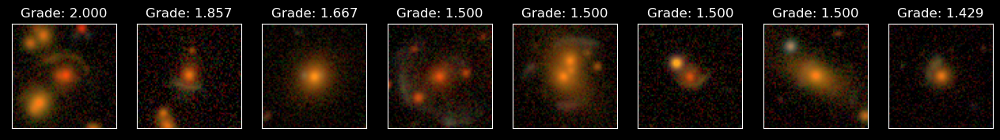

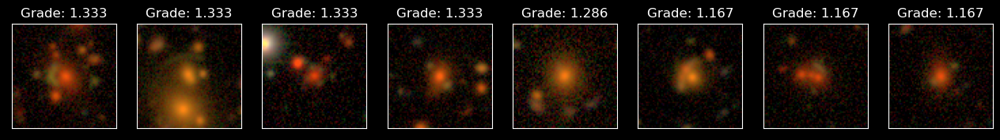

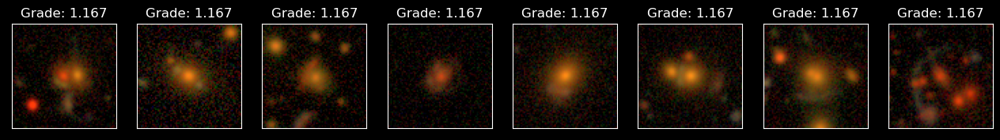

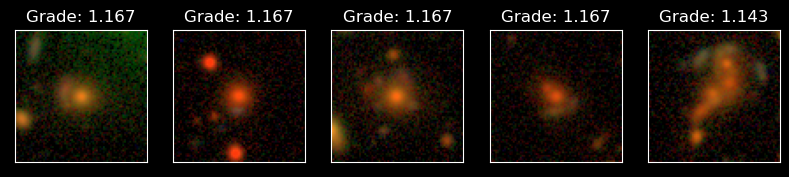

In [7]:
%matplotlib inline
data_tmp = data_zoo[(data_zoo['average'] > 1) & (data_zoo['SINGLE'] < 0.05)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

65


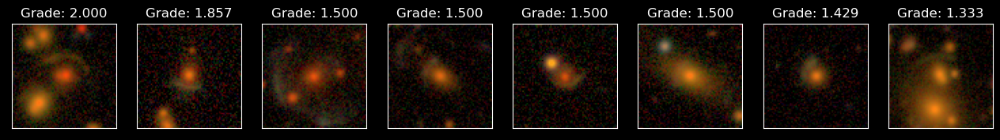

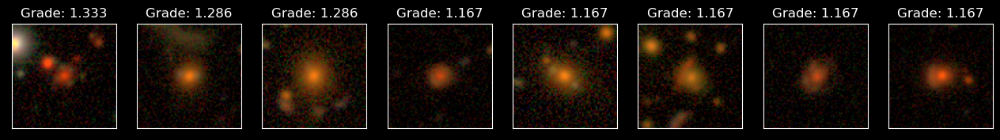

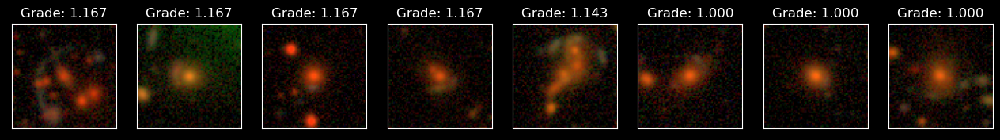

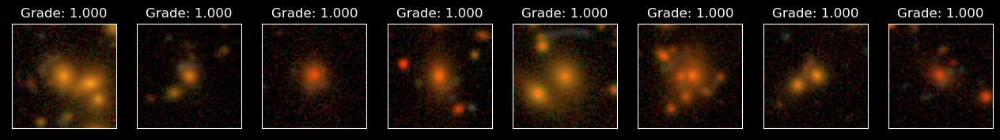

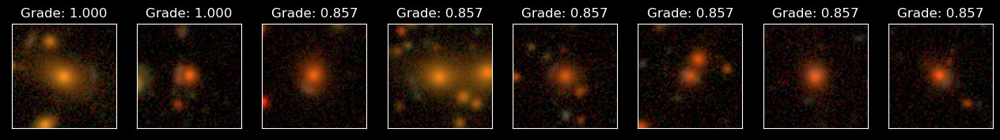

...

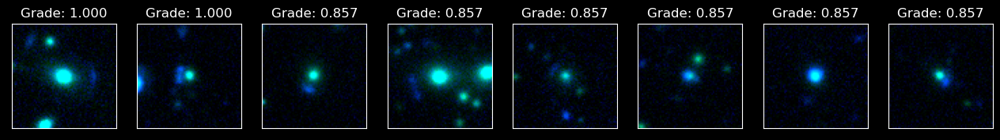

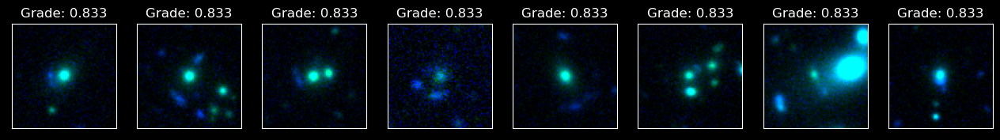

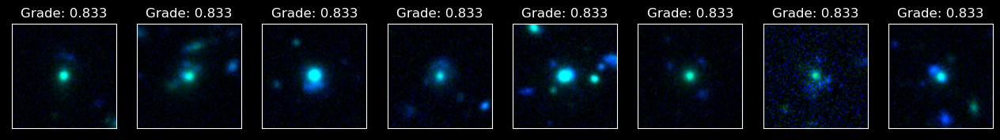

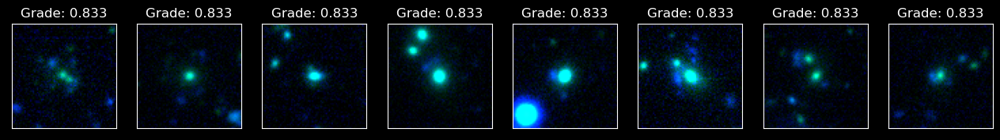

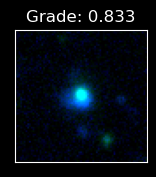

In [8]:
data_tmp = data_zoo[(data_zoo['average'] > 0.8) & (data_zoo['SINGLE'] < 0.1) & (data_zoo['K_SCORE'] < 0.1)
                   & (data_zoo['score_real'] < 0.1)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

make_plot_all_brit(images_tmp, 'title', data_tmp)

29


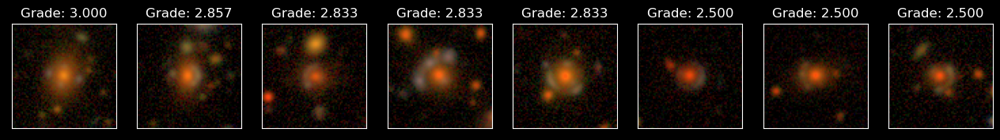

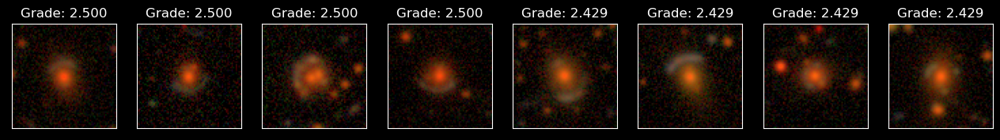

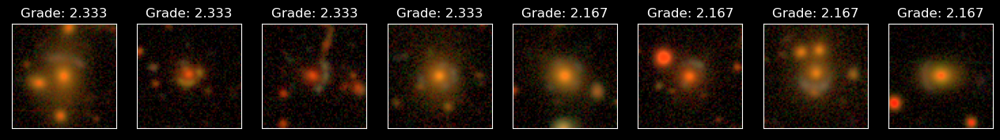

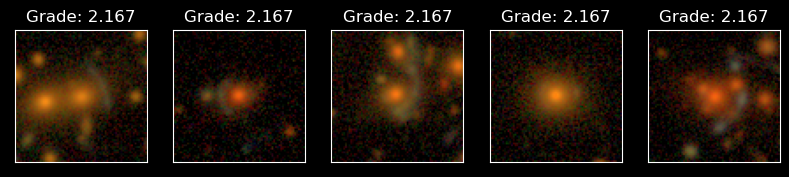

In [9]:
data_tmp = data_zoo[(data_zoo['average'] > 2) & (data_zoo['score_real'] < 0.05)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

45


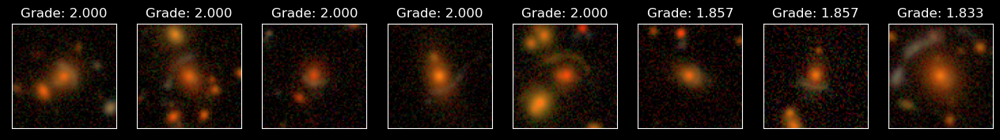

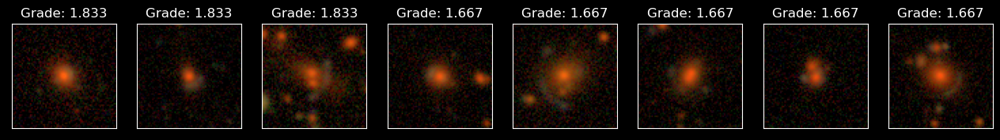

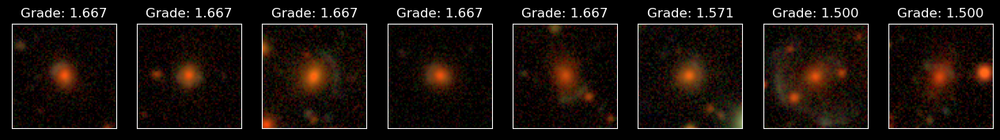

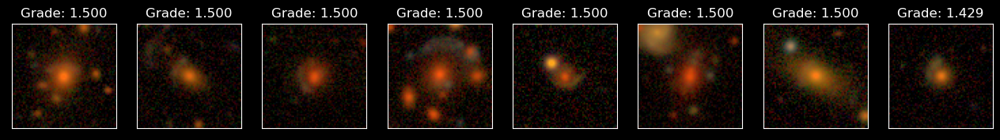

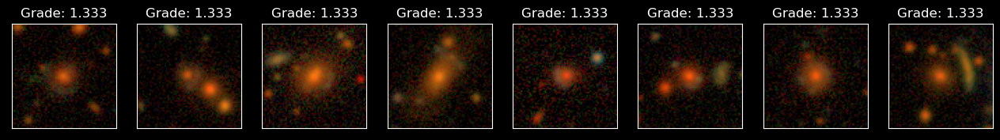

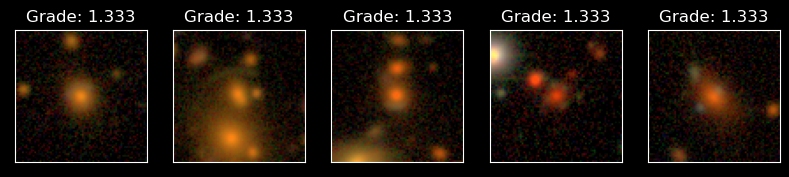

In [10]:
data_tmp = data_zoo[(data_zoo['average'] > 1.3) & (data_zoo['K_SCORE'] < 0.05)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

29


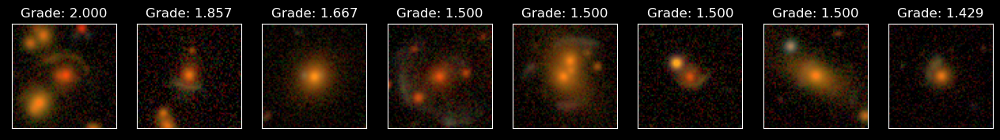

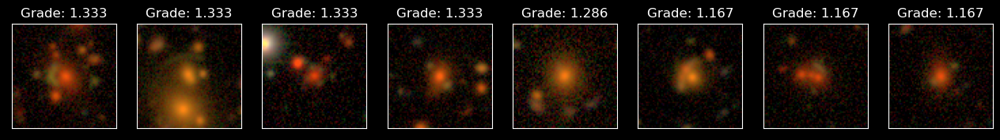

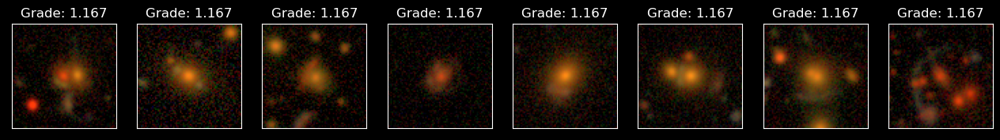

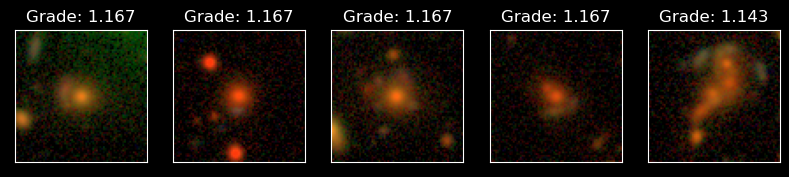

In [11]:
data_tmp = data_zoo[(data_zoo['average'] > 1.) & (data_zoo['SINGLE'] < 0.05)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

8


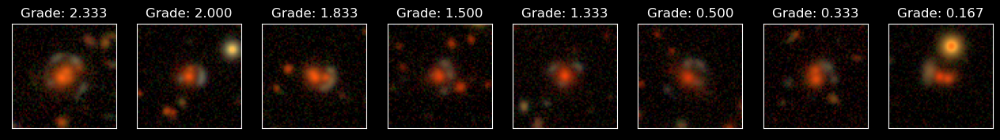

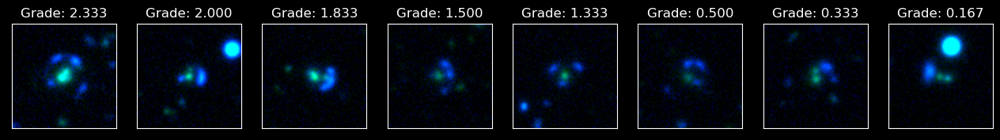

In [12]:
data_tmp = data_zoo[(data_zoo['average'] < 2.8) & (data_zoo['SINGLE'] > 0.8) & (data_zoo['K_SCORE'] > 0.8)
                   & (data_zoo['score_real'] > 0.8)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

make_plot_all_brit(images_tmp, 'title', data_tmp)

34


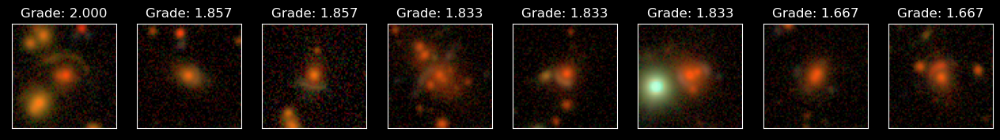

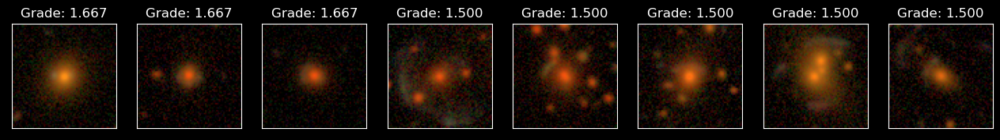

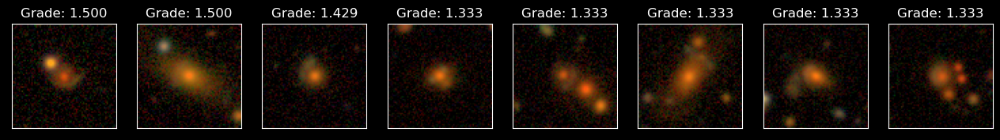

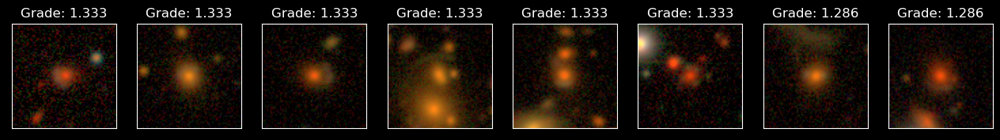

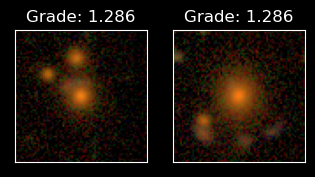

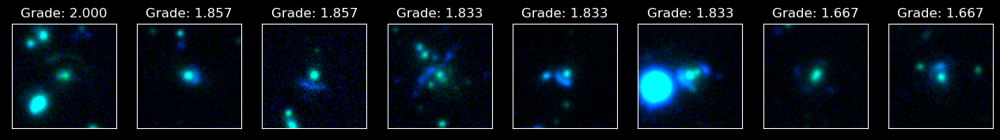

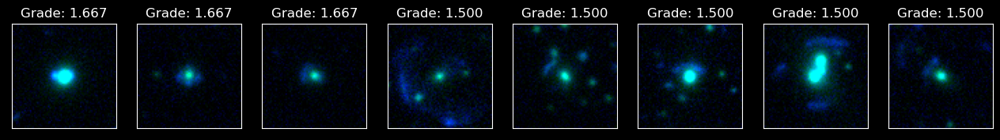

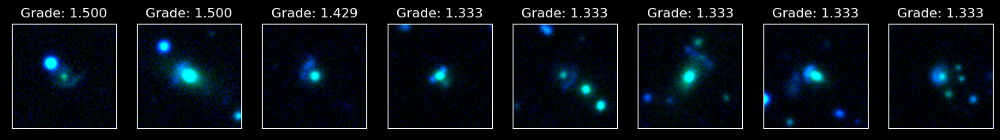

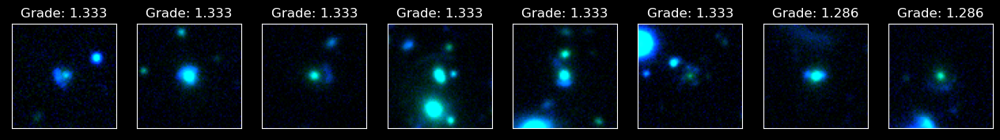

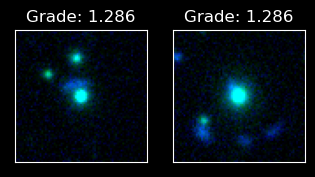

In [13]:
data_tmp = data_zoo[(data_zoo['average'] > 1.2) & (data_zoo['SINGLE'] < 0.8) & (data_zoo['K_SCORE'] < 0.8)
                   & (data_zoo['score_real'] < 0.8)]
images_tmp = images[data_tmp.index]
print(len(data_tmp))

make_plot_all(images_tmp, 'title', data_tmp)

make_plot_all_brit(images_tmp, 'title', data_tmp)

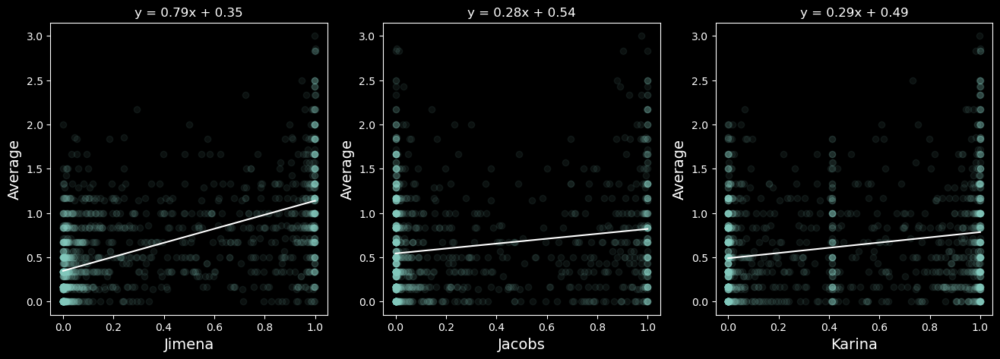

In [14]:
from sklearn.linear_model import LinearRegression

linear_regressor = LinearRegression()

#Studying correlations
plt.figure(figsize=(16,5)) 
    
X, Y = data_zoo['SINGLE'].values.reshape(-1, 1) , data_zoo['average'].values.reshape(-1, 1) 
linear_regressor.fit(X, Y) 
x = np.linspace(0, 1 ,100)
y = linear_regressor.coef_[0]*x + linear_regressor.intercept_

plt.subplot(1,3,1)
plt.ylabel('Average', fontsize=14)
plt.xlabel('Jimena', fontsize=14)
plt.plot(data_zoo['SINGLE'], data_zoo['average'], 'o', alpha=0.08)
equation = 'y = {:.2f}x + {:.2f}'.format(linear_regressor.coef_[0][0], linear_regressor.intercept_[0])
plt.title(equation)
plt.plot(x, y, color='w')

X, Y = data_zoo['score_sims'].values.reshape(-1, 1) , data_zoo['average'].values.reshape(-1, 1) 
linear_regressor.fit(X, Y) 
x = np.linspace(0, 1 ,100)
y = linear_regressor.coef_[0]*x + linear_regressor.intercept_

plt.subplot(1,3,2)
plt.ylabel('Average', fontsize=14)
plt.xlabel('Jacobs', fontsize=14)
plt.plot(data_zoo['score_sims'], data_zoo['average'], 'o', alpha=0.08)
equation = 'y = {:.2f}x + {:.2f}'.format(linear_regressor.coef_[0][0], linear_regressor.intercept_[0])
plt.title(equation)
plt.plot(x, y, color='w')

X, Y = data_zoo['K_SCORE'].values.reshape(-1, 1) , data_zoo['average'].values.reshape(-1, 1) 
linear_regressor.fit(X, Y) 
x = np.linspace(0, 1 ,100)
y = linear_regressor.coef_[0]*x + linear_regressor.intercept_

plt.subplot(1,3,3)
plt.xlabel('Karina', fontsize=14)
plt.ylabel('Average', fontsize=14)
plt.plot(data_zoo['K_SCORE'], data_zoo['average'], 'o', alpha=0.08)
equation = 'y = {:.2f}x + {:.2f}'.format(linear_regressor.coef_[0][0], linear_regressor.intercept_[0])
plt.title(equation)
plt.plot(x, y, color='w')
        
plt.show()

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


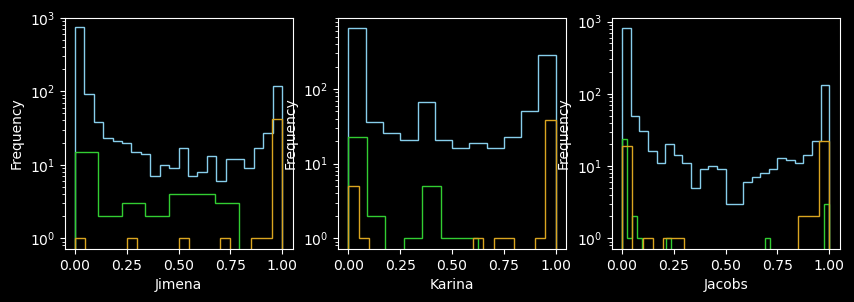

In [15]:
#data_tmp = data[data['average'] > 1.5]


#data_tmp = data_exp[data_exp['PROB']>=0.1]
data_tmp1 = data_zoo[data_zoo['average'] < 1.]
data_tmp2 = data_zoo[(data_zoo['average'] >= 1.) & (data_tmp['average'] < 2.)]
data_tmp3 = data_zoo[data_zoo['average'] >= 2]

plt.figure(figsize=(10,3))

plt.subplot(1,3,1)
plt.xlabel('Jimena')
plt.ylabel('Frequency')
#plt.title('Distribution ML score for different expert samples')
plt.hist(data_tmp1['SINGLE'], bins='auto', color='skyblue', histtype='step', label='Exp. score < 1')
plt.hist(data_tmp2['SINGLE'], bins='auto', color='limegreen', histtype='step', label='1 < Exp. score < 2')
plt.hist(data_tmp3['SINGLE'], bins=20, color='goldenrod', histtype='step', label='Exp. score > 2')
plt.yscale('log')
plt.ylim(0, 1000)
#plt.hist(data_random['Aver_norm_wo_8'], bins='auto', color='limegreen', histtype='step', label='Random')
#plt.legend()#(loc='upper left') 

plt.subplot(1,3,2)
plt.xlabel('Karina')
plt.ylabel('Frequency')
#plt.title('Distribution ML score for different expert samples')
plt.hist(data_tmp1['K_SCORE'], bins='auto', color='skyblue', histtype='step', label='Exp. score < 1')
plt.hist(data_tmp2['K_SCORE'], bins='auto', color='limegreen', histtype='step', label='1 < Exp. score < 2')
plt.hist(data_tmp3['K_SCORE'], bins=20, color='goldenrod', histtype='step', label='Exp. score > 2')
plt.yscale('log')

plt.subplot(1,3,3)
plt.xlabel('Jacobs')
plt.ylabel('Frequency')
#plt.title('Distribution ML score for different expert samples')
plt.hist(data_tmp1['score_sims'], bins='auto', color='skyblue', histtype='step', label='Exp. score < 1')
plt.hist(data_tmp2['score_sims'], bins='auto', color='limegreen', histtype='step', label='1 < Exp. score < 2')
plt.hist(data_tmp3['score_sims'], bins=20, color='goldenrod', histtype='step', label='Exp. score > 2')
plt.yscale('log')

plt.show()

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


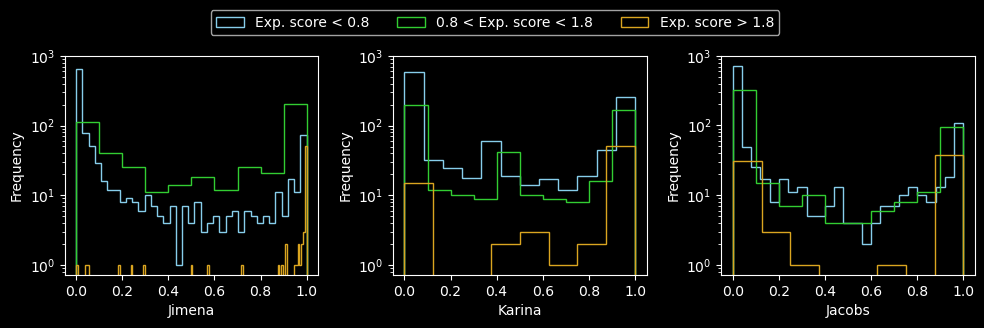

In [16]:
data_tmp1 = data_zoo[data_zoo['average'] < 0.8]
data_tmp2 = data_zoo[(data_zoo['average'] >= 0.8) & (data_zoo['average'] < 1.8)]
data_tmp3 = data_zoo[data_zoo['average'] >= 1.8]

plt.figure(figsize=(10, 3))

# Define a function to add histograms and get legend handles
def plot_histogram(data, column, color, label):
    return plt.hist(data[column], bins='auto', color=color, histtype='step', label=label)

# Plot histograms for each subplot and collect handles for the legend
handles = []
labels = ['Exp. score < 0.8', '0.8 < Exp. score < 1.8', 'Exp. score > 1.8']
colors = ['skyblue', 'limegreen', 'goldenrod']

# First subplot
plt.subplot(1, 3, 1)
plt.xlabel('Jimena')
plt.ylabel('Frequency')
handles.append(plot_histogram(data_tmp1, 'SINGLE', colors[0], labels[0])[2][0])
handles.append(plot_histogram(data_tmp2, 'SINGLE', colors[1], labels[1])[2][0])
handles.append(plot_histogram(data_tmp3, 'SINGLE', colors[2], labels[2])[2][0])
plt.yscale('log')
plt.ylim(0, 1000)

# Second subplot
plt.subplot(1, 3, 2)
plt.xlabel('Karina')
plt.ylabel('Frequency')
plot_histogram(data_tmp1, 'K_SCORE', colors[0], labels[0])
plot_histogram(data_tmp2, 'K_SCORE', colors[1], labels[1])
plot_histogram(data_tmp3, 'K_SCORE', colors[2], labels[2])
plt.yscale('log')
plt.ylim(0, 1000)

# Third subplot
plt.subplot(1, 3, 3)
plt.xlabel('Jacobs')
plt.ylabel('Frequency')
plot_histogram(data_tmp1, 'score_sims', colors[0], labels[0])
plot_histogram(data_tmp2, 'score_sims', colors[1], labels[1])
plot_histogram(data_tmp3, 'score_sims', colors[2], labels[2])
plt.yscale('log')
plt.ylim(0, 1000)

# Add the universal legend
plt.figlegend(handles, labels, loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.1))

plt.tight_layout()
plt.show()

In [17]:
#calculate purity rates for each bin, 
# 2d ROC curve including threshold for all three of us
#Look at pairs of us ()
#Makes more sense to use other networks, and not lower the thresholds.

#Goals: Compare ML methods & understand where true lenses live in the space
